This script contains the following:
1. Import data and libraries
2. Data wrangling
3. Plotting a choropleth

### 1. Import libraries and data

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import folium
import geopandas as gpd

In [5]:
# This command propts matplotlib visuals to appear in the notebook 

%matplotlib inline

In [6]:
# Import geoJSON file for Seattle neighborhoods

seattle_geo = gpd.read_file('/Users/tuyetnguyen/Desktop/Career Foundry/Achievement 6/09-2023 Airbnb Listings and Neighborhoods Analysis/02 Data/Prepared Data/neighborhoods.geojson')

In [7]:
seattle_geo

,id,city,county,nhood,nested,area,name,geometry
0,Seattle:Ballard:Loyal Heights,Seattle,King,Ballard,Loyal Heights,2.132066e+07,Loyal Heights,"POLYGON ((-122.37633 47.67594, -122.37669 47.6..."
1,Seattle:Ballard:Adams,Seattle,King,Ballard,Adams,2.243128e+07,Adams,"POLYGON ((-122.37633 47.67594, -122.37621 47.6..."
2,Seattle:Ballard:Whittier Heights,Seattle,King,Ballard,Whittier Heights,1.419569e+07,Whittier Heights,"POLYGON ((-122.37633 47.67594, -122.37657 47.6..."
3,Seattle:Ballard:West Woodland,Seattle,King,Ballard,West Woodland,2.219937e+07,West Woodland,"POLYGON ((-122.37633 47.67594, -122.37610 47.6..."
4,Seattle:Ballard:Sunset Hill,Seattle,King,Ballard,Sunset Hill,2.433562e+07,Sunset Hill,"POLYGON ((-122.40211 47.69766, -122.40199 47.6..."
...,...,...,...,...,...,...,...,...
170,Bellevue:Sammamish - East Lake Hills:,Bellevue,King,Sammamish - East Lake HillS,NaN,8.560098e+07,Sammamish - East Lake HillS,"POLYGON ((-122.13241 47.61699, -122.12815 47.6..."
171,Bellevue:Eastgate - Cougar Mountain:,Bellevue,King,Eastgate - Cougar Mountain,NaN,1.056104e+08,Eastgate - Cougar Mountain,"MULTIPOLYGON (((-122.10651 47.56870, -122.1064..."
172,Vashon::,Vashon,King,NaN,NaN,1.018176e+09,Vashon Island,"POLYGON ((-122.47329 47.51113, -122.47305 47.5..."
173,White Center::,White Center,King,NaN,NaN,6.317994e+07,White Center,"POLYGON ((-122.37137 47.50275, -122.37125 47.5..."


In [8]:
# Define path: 
path = r'/Users/tuyetnguyen/Desktop/Career Foundry/Achievement 6/09-2023 Airbnb Listings and Neighborhoods Analysis'

In [9]:
# Import data
df = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'listings_prepared.csv'))

In [10]:
df.head()

,Unnamed: 0,room_type,accommodates,bedrooms,bathrooms,amenities,price,minimum_nights,maximum_nights,number_of_reviews,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,neighborhood,latitude,longitude,total_amenities,price_per_room,Price category
0,0,0,5,2.0,2.0,"['[Private patio or balcony', ' Ceiling fan', ...",240.0,4,200,24,...,5.00,5.00,4.61,4.65,Columbia City,47.56555,-122.29385,67,120.0,Moderate
1,1,0,4,2.0,1.0,"['[45\\ HDTV with Netflix', ' HBO Max', ' Hulu...",200.0,3,1125,60,...,4.98,5.00,5.00,4.83,Green Lake,47.68243,-122.33086,68,100.0,Affordable
2,2,0,2,1.0,1.0,"['[Dryer \\u2013\\u00a0In unit', ' Carbon mono...",81.0,30,731,2,...,5.00,5.00,3.50,5.00,Adams,47.66646,-122.37650,30,81.0,Affordable
3,3,0,2,1.0,1.0,"['[Baking sheet', ' Carbon monoxide alarm', ' ...",125.0,30,150,28,...,5.00,5.00,4.96,4.89,Wallingford,47.65480,-122.34042,35,125.0,Moderate
4,4,0,4,1.0,1.0,['[Free driveway parking on premises \\u2013 1...,128.0,30,1125,31,...,4.87,4.77,4.93,4.33,Montlake,47.64017,-122.32271,21,128.0,Moderate


### 2. Data Wrangling

##### Extreme values checks

<Axes: xlabel='price_per_room', ylabel='Count'>

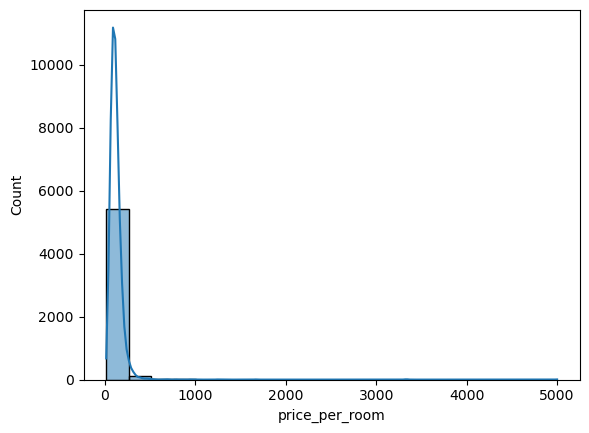

In [11]:
sns.histplot(df['price_per_room'], bins=20, kde = True) # shows extreme values for 'fat'

In [12]:
# Clean extreme values

filtered_df = df[df['price_per_room'] < 600] 
# rooms over $600 are unusually high-priced listings.

### 3.  Plotting a choropleth

In [13]:
# Create a data frame with just the states and the values for rating we want plotted

data_to_plot = filtered_df[['neighborhood','price_per_room']]
data_to_plot.head()

,neighborhood,price_per_room
0,Columbia City,120.0
1,Green Lake,100.0
2,Adams,81.0
3,Wallingford,125.0
4,Montlake,128.0


In [14]:
# Create a map centered on Seattle
map = folium.Map(location=[47.6062, -122.3321], zoom_start=12)

# Choropleth maps bind Pandas DataFrames and GeoJSON geometries.
folium.Choropleth(
    geo_data=seattle_geo,
    data=data_to_plot,  # Assuming this DataFrame contains the data to be plotted
    columns=['neighborhood', 'price_per_room'],
    key_on='feature.properties.name',  # Use the correct key
    fill_color='YlOrBr',
    fill_opacity=0.6,
    line_opacity=0.1,
    legend_name="Price per Room"
).add_to(map)


# Display the map
map


In [15]:
# Add neighborhood names as labels to the map
for idx, row in seattle_geo.iterrows():
    label = folium.Popup(row['name'], parse_html=True)  # Create a label with the neighborhood name
    folium.CircleMarker(
        location=[row['geometry'].centroid.y, row['geometry'].centroid.x],  # Centroid of each neighborhood
        radius=5,  # Adjust the radius as needed for label size
        color='black',
        fill=True,
        fill_color='white',
        fill_opacity=0.7,
        popup=label,  # Attach the label to the circle marker
    ).add_to(map)

# Add a layer control to toggle layers on/off
folium.LayerControl().add_to(map)

# Display the map
map

The map displayed above lacks sufficient information. To enhance its utility, the analyst has chosen to <b>integrate tourist attraction locations into the map</b>. This addition will aid in testing the hypothesis that property proximity to popular tourist attractions is positively correlated with its average rental price.

In [ ]:
map.figure.savefig(os.path.join(path, '04 Analysis','Visualizations', 'pair_plot.png'), bbox_inches = 'tight')

In [16]:
# ADD TOURIST ATTRACTION SPOTS TO THE MAP

# Load attraction point data from a GeoJSON file (replace 'attractions.geojson' with your file path)
attractions_geo = gpd.read_file('/Users/tuyetnguyen/Desktop/Career Foundry/Achievement 6/09-2023 Airbnb Listings and Neighborhoods Analysis/02 Data/Prepared Data/attraction_point.geojson')

# Add the attraction point data to the map
folium.GeoJson(attractions_geo).add_to(map)


# Add a layer control to toggle layers on/off
folium.LayerControl().add_to(map)

# Display the map
map


The map indicates that areas featuring tourist attractions are shown as darker-shaded regions. In simpler terms, properties located near these attractions tend to have higher listing prices. However, it's worth noting that some dark-shaded areas do not have any tourist attractions. This may be due to factors other than tourist spots, such as their proximity to city centers, upscale neighborhoods, or other attractive amenities, contributing to the dark shading.

In [17]:
map.save('plot_data.html')

plot_data.html

In [18]:
filtered_df.to_csv(os.path.join(path, '02 Data','Prepared Data', 'listings_cleaned_no_extreme.csv'))